# Getting Started with CellRank

In this tutorial, you will learn how to:

+ Use CellRank kernels to compute a transition matrix of cellular dynamics.

+ Use CellRank estimators to analyze the transition matrix, including the computation of fate probabilities, driver genes, and gene expression trends.

+ Read and write CellRank kernels.

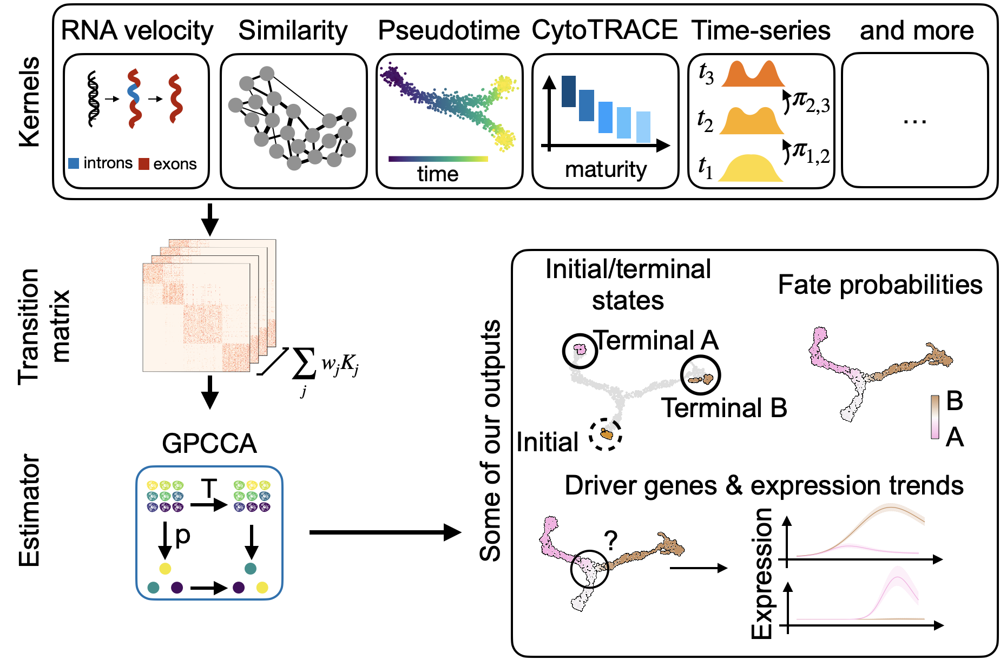

In [ ]:
#!pip install matplotlib==3.7
#!pip install pandas==1.4.1 # for categorical property 

# Import packages & data

In [1]:
import cellrank as cr
import numpy as np
import scipy.stats as st
import scvelo as scv
import scanpy as sc
import scanpy as sc
import pandas as pd
import loompy
import session_info
sc.settings.set_figure_params(frameon=False, dpi=100)
cr.settings.verbosity = 2

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [ ]:
import warnings

warnings.simplefilter("ignore", category=UserWarning)

In [ ]:
adata = scv.read('/path/file&DynVelo.h5ad', cache=True)
adata

In [ ]:
scv.pl.proportions(adata, groupby="batch")
adata

In [ ]:
sc.pl.embedding(adata, basis="umap", color= "batch", wspace=.5)

The scVelo’s dynamical model was runned to estimate model parameters in the **`RNA velocity pipeline`**.

In [ ]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color='batch', 
                                 legend_loc='right margin')

We’ll use CellRank to visualize the velocities in an embedding further down below.

# Combine RNA velocity with expression similarity in high dimensions

### Set up the VelocityKernel

Set up the VelocityKernel from the AnnData object containing the scVelo-computed velocities.

+ **Kernel overview**

There exist CellRank kernels for many different data modalities. Each modality and biological system comes with its own strenghts and limitations, so it’s important to choose the kernel carefully. We provide some guidance in the figure below. However, please check the kernel API for a complete and up-to-date list, as new kernels will come.

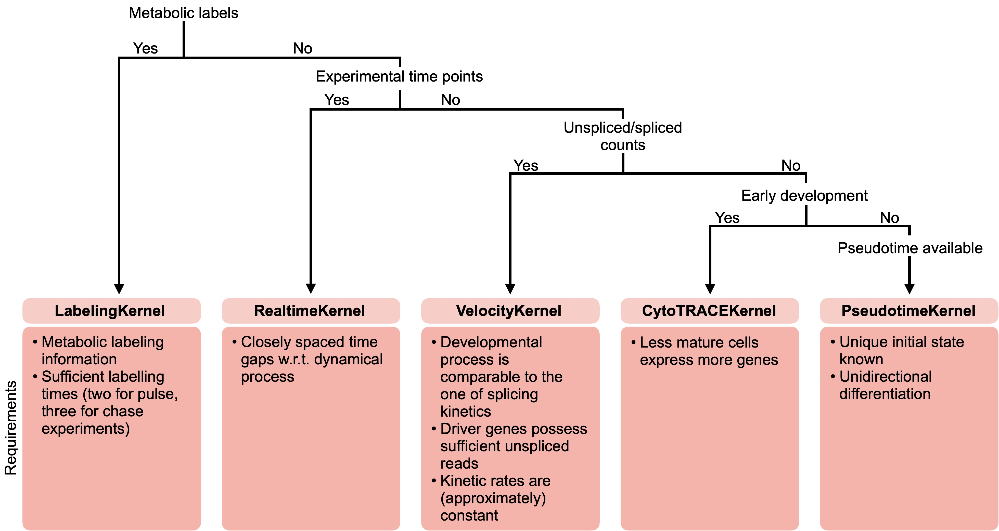

In [ ]:
vk = cr.kernels.VelocityKernel(adata)

Use the VelocityKernel to compute a transition matrix by correlating each cell’s velocity vector with the displacement vectors towards nearest neighbors, directly in high-dimensional gene expression space.

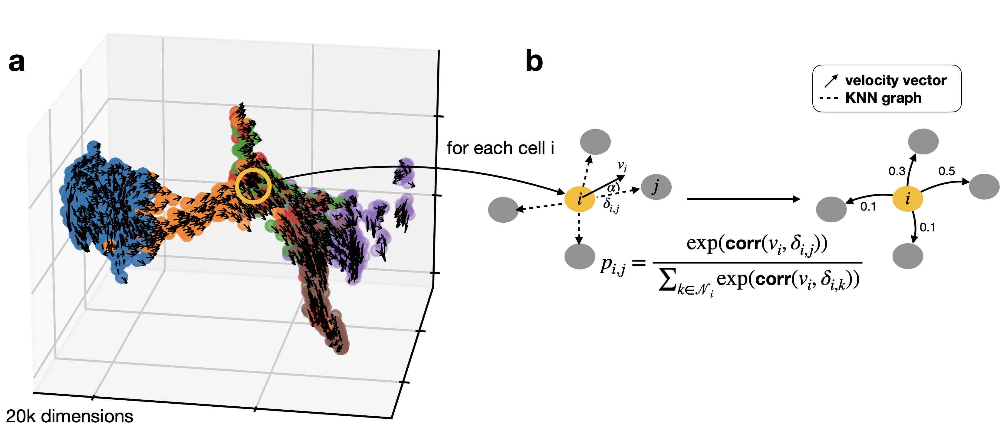

**Computing transition probabilities**: We correlate each cell’s velocity vector with the transcriptomic displacement vectors towards nearest neighbors.

We do this using the compute_transition_matrix() method.

In [ ]:
vk.compute_transition_matrix()

By default, we use the deterministic mode to compute the transiton matrix. If you want to propagate uncertainty in the velocity vectors, check out the stochastic and monte_carlo modes. The stochastic mode estimates a distribution over velocity vectors using the KNN graph and propagates this distribution into the transition matrix using an analytical approximation.

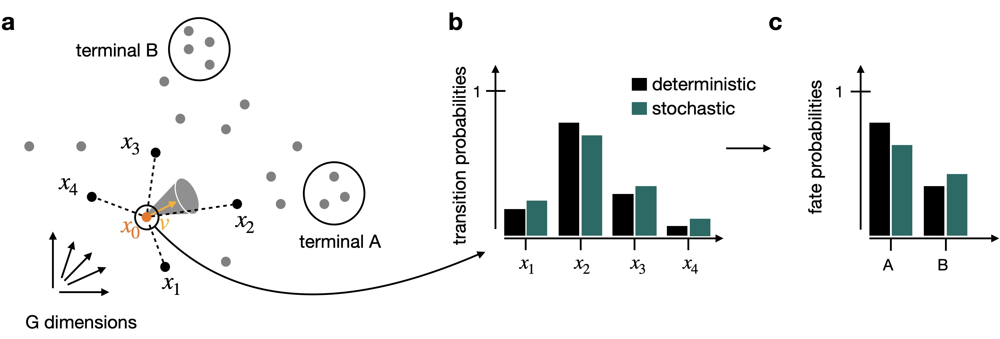
**Propagating velocity uncertainty**: CellRank can propagate estimated velocity uncertainties into transition probabilities.

### Combine with gene expression similarity

RNA velocity can be a very noise quantity; to make our computations more robust, we combine the VelocityKernel with the similarity-based ConnectivityKernel.



In [ ]:
ck = cr.kernels.ConnectivityKernel(adata)
ck.compute_transition_matrix()

combined_kernel = 0.8 * vk + 0.2 * ck

Above, we combined the two kernels with custom weights given to each. The same syntax can be used to combine any number of CellRank kernels, see the getting started tutorial.

Let’s print the combined kernel object to see what it contains:

In [ ]:
print(combined_kernel)

This tells us about the kernels we combined, the weights we used to combine them, and the parameters that went into transition matrix computation for each kernel. Check out the API to learn more about the parameters. Next, let’s explore ways to visualize the computed transition matrix.

### Visualize the transition matrix
Similar to scvelo [Bergen et al., 2020] and velocyto [La Manno et al., 2018], CellRank visualizes the transition matrix in any low dimensional embedding (UMAP, t-SNE, PCA, Diffmap, etc.) via arrows or streamlines.

In [ ]:
vk.plot_projection(color='batch', 
                                 legend_loc='right margin')

As shown before in the scVelo publication [Bergen et al., 2020], the projected velocity vectors capture the overall trend in this system: SS005 gradually transition via indermediate stages towards terminal, SS008, SS006 and SS007. Another way to visualize this is via random walks.

In [ ]:
vk.plot_random_walks(start_ixs={"batch": "SS005"}, max_iter=200, seed=0)
                     

# Identify initial and terminal states
## Initialize an estimator
The estimators allow you to analyze cell-state dynamics in CellRank. We initialize the GPCCA estimator here by passing the VelocityKernel [Reuter et al., 2019, Reuter et al., 2018]. However, the GPCCA estimator works with every CellRank kernel.

In [ ]:
g = cr.estimators.GPCCA(vk)
print(g)

### Basic usage
We fit the estimator; this computes a Schur decompsition and uses the GPCCA algorithm as implemented in pyGPCCA to compute macrostates by maximizing for metastability [Reuter et al., 2019, Reuter et al., 2022, Reuter et al., 2018]. macrostates may contain initial, terminal and intermediate states of cellular dynamics.

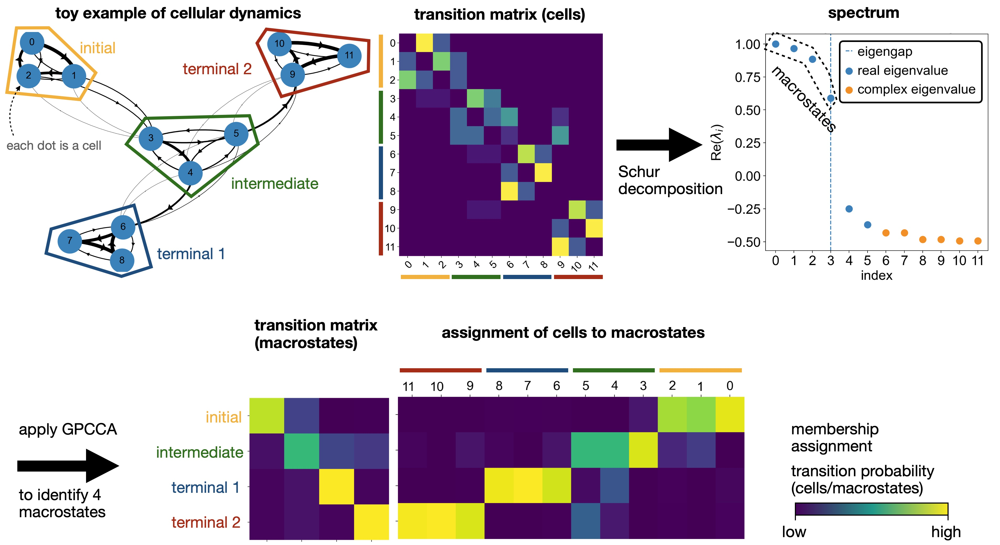
**Coarse-graining with GPCCA**: Using the GPCCA algorithm, CellRank coarse-grains a cell-cell transition matrix onto the macro-state level. We obtain two key outputs: the soft assignment of cells to macrostates, and a matrix of transition probabilities among these macrostates [Reuter et al., 2019, Reuter et al., 2022, Reuter et al., 2018].

In [ ]:
g.fit(cluster_key="batch", n_states=[2, 14])
g.plot_macrostates(which="all", discrete=True, legend_loc="right", s=100)

Using n_states=[a, b], we told the algorithm to scan this interval for the optimal number of macrostates. It identified 3 macrostates which we show above in the UMAP. For each macrostate, we display the n_cells cells most strongly associated with it. Each macrostate was automatically assigned a label by associating it with the cluster labels stored in adata.obs['clusters']; this is controled using cluster_key.

You can check out the pyGPCCA documentation for more information on the macrostate computation.

In [ ]:
g.predict_terminal_states()
g.plot_macrostates(which="terminal", legend_loc="right", s=100)

In [ ]:
g.plot_macrostates(which="terminal", discrete=False)

Each cell is colored according to the terminal state it most likely belongs to; higher color intensity reflects greater confidence in the assignment.

In [ ]:
g.predict_initial_states(allow_overlap=True)
g.plot_macrostates(which="initial", legend_loc="right", s=100)

We can visually confirm our terminal state identification by comparing with know markers for each condition SS006 and SS007. To confirm our initial state identification, we visualize markers of SS008.
+ PS : All these genes were identified in RNA velocity pipeline.

In [ ]:
scv.tl.rank_dynamical_genes(adata, groupby='batch')
df = scv.get_df(adata, 'rank_dynamical_genes/names')
df.head(10)

In [ ]:
vk.plot_projection(color='batch', 
                                 legend_loc='right margin')

In [ ]:
sc.pl.embedding(
    adata,
    basis="umap",
    color=["PAM", "MT1E", "AREG", "IGF1R", "ISG15", "IFIT1"],
    size=50, ncols=3
)

Visually, these marker genes agree well with automatically identified initial and terminal states

To make this a bit more quantitative, let’s check whether our terminal SS007 express ISG15 at higher levels compared to other (non-terminal).

In [ ]:
# subset to just SS007
bdata = adata[adata.obs["batch"] == "SS007"].copy()

# create an annotation for terminal vs. not-terminal
bdata.obs["maturation_state"] = np.where(
    bdata.obs["term_states_fwd"] == "SS007", "terminal", "not terminal"
)

# show distribution in violin plot
sc.pl.violin(bdata, keys=["ISG15"], groupby="maturation_state")

# use a simple t-test to quantify how different the two distributions are
a = bdata[bdata.obs["maturation_state"] == "terminal", "ISG15"].X.data
b = bdata[bdata.obs["maturation_state"] == "not terminal", "ISG15"].X.data
st.ttest_ind(a, b, equal_var=False)

In [ ]:
g.plot_coarse_T(annotate=False)

This transition matrix aggregates the single-cell Markov chain to a macrostate-level Markov chain. Entries in this matrix tell us how likely macrostates are to transition into one-another. We identify initial and terminal states based on the following criteria:

+ **`terminal_states`** are very stable (large value on the diagonal). They can have incoming probability mass, but almost no outgoing probability mass.

+ **`initial_states`** are less stable (smaller values on the diagonal and in the coarse-grained stationary distribution). They can have outgoing, but almost no incoming probability mass.

+ **`intermediate states`** are just all remaining macrostates which we classified neither as terminal nor as initial.

Note that the automatic identification does not always work perfectly. For example, we did not automatically identify the initial SS005 population in our analysis above. For this reason, we’ll next explore the low-level mode to interact with the GPCCA estimator which offers a bit more control and supervision to bring in any prior knowledge that you might have about the biological system.

### Advanced usage
Let’s start with a new estimator object.

In [ ]:
g2 = cr.estimators.GPCCA(vk)
print(g2)

The computation of macrostates is based on the real Schur decomposition - essentially a generalization of the eigendecomposition. For non-symmetric transition matrices, as in our case, the eigendecomposition in general yields complex eigenvalues and eigenvectors, which are difficult to interpret. Thus, we revert to the real Schur decomposition [Reuter et al., 2019, Reuter et al., 2018].

Below, we also plot the real part of the top eigenvalues, sorted by their real part. Blue and orange denote real and complex eigenvalues, respectively. For real matrices, complex eigenvalues always appear in pairs of complex conjugates.

In [ ]:
g2.compute_schur()
g2.plot_spectrum(real_only=True)

Using the real Schur decomposition, we compute macrostates. In the plot above, the estimator automatically suggested a number of states to use (dashed vertical line); however, we will ignore that and compute a few more states to have a chance at identifying the SS005 population.

In [ ]:
g2.compute_macrostates(n_states=4, cluster_key="batch")
g2.plot_macrostates(which="all", legend_loc="right", s=100)

We now have macrostates for SS005, SS006, SS007 and SS008 populations, besides a few progenitor populations. We assign one label per macrostate based on the underlying 'clusters' annotation. However, that does not imply that all cells within one macrostate are from the same underlying cluster as we use majority voting. We can visualize the relationship between clusters and macrostates. We show below the distribution over cluster membership for each of the cells most confidently assigned to a certain macrostate.

In [ ]:
g2.plot_macrostate_composition(key="batch", figsize=(7, 4))

With some exceptions, most macrostates recruit their top-cells from a single underlying cluster. This plotting function works for any observation-level covariate and can be useful when we have experimental time labels as we expect more mature states to come from later time points. See the RealTimeKernel and the corresponding tutorial to learn how CellRank makes use of experimental time points.

To get an idea of how these macrostates are related, we plot the coarse-grained transition matrix.

In [ ]:
vk.plot_projection(color='batch', 
                                 legend_loc='right margin')

In [ ]:
g2.plot_coarse_T()

By default, macrostates are ordered according to their diagonal value, increasing from left to right. The diagonal value is a proxy for a states’ metastability, i.e. the probability of leaving the state once entered. While the SS005, SS006 and SS008 states have low diagonal values, SS007 have a high value because they are predicted to transition into SS007 (check the corresponding matrix element).

Let’s try automatic terminal state identification.

In [ ]:
g2.predict_terminal_states()
g2.plot_macrostates(which="terminal", legend_loc="right", s=100)

Besides many more macrostates being present now, this consistently identified the same three terminal states as before. However, we still did not catch the Delta cells! If we want to compute fate probabilities towards them later on, we need to annotate them as a terminal state. Luckily, this can be done semi-automatically as well:

In [ ]:
# g2.set_terminal_states(states=["WT&IFNb&vRNA_1", "WT&IFNb&vRNA_2", "WT&IFNb&vRNA_3"])
# g2.plot_macrostates(which="terminal", legend_loc="right", s=100)

We call this semi-automatic terminal state identification as we manually pass the macrostates we would like to select, however, the actual cells belonging to each macrostate are assigned automatically. For initial states, everything works exactly the same, you can identify them fully automatically, or semi-automatically. Let’s compute the initial states fully automatically here:

In [ ]:
g2.predict_initial_states(allow_overlap=True)
g2.plot_macrostates(which="initial", s=100)

How can we check whether this is really the correct initial state? In this case, we have prior knowledge that we can use: we know that the initial state should be high for a number of SS005 markers. So let’s use these markers to compute a score that we can visualize across macrostates to confirm that we have the correct one.

In [ ]:
# compute a score in scanpy by aggregating across a few ductal markers
sc.tl.score_genes(
    adata, gene_list=["RND3", "IGF1R"], score_name="initial_score"
)

# write macrostates to AnnData
adata.obs["macrostates"] = g2.macrostates
adata.uns["macrostates_colors"] = g2.macrostates_memberships.colors

# visualize via heatmaps
sc.pl.violin(adata, keys="initial_score", groupby="macrostates", rotation=90)


How can we check whether this is really the correct terminal state? In this case, we have prior knowledge that we can use: we know that the terminal state should be high for a number of SS007 markers. So let’s use these markers to compute a score that we can visualize across macrostates to confirm that we have the correct one.

In [ ]:
# compute a score in scanpy by aggregating across a few ductal markers
sc.tl.score_genes(
    adata, gene_list=["ISG15", "IFIT1"], score_name="terminal_score"
)

# write macrostates to AnnData
adata.obs["macrostates"] = g2.macrostates
adata.uns["macrostates_colors"] = g2.macrostates_memberships.colors

# visualize via heatmaps
sc.pl.violin(adata, keys="terminal_score", groupby="macrostates", rotation=90)

# Estimating Fate Probabilities and Driver Genes

## Preliminaries
In this tutorial, you will learn how to:

compute and visualize fate probabilities towards terminal states.

aggregate fate probabilities over groups of cells to uncover fate-biased populations.

correlate fate probabilities with gene expression to detect putative driver genes of fate decisions.
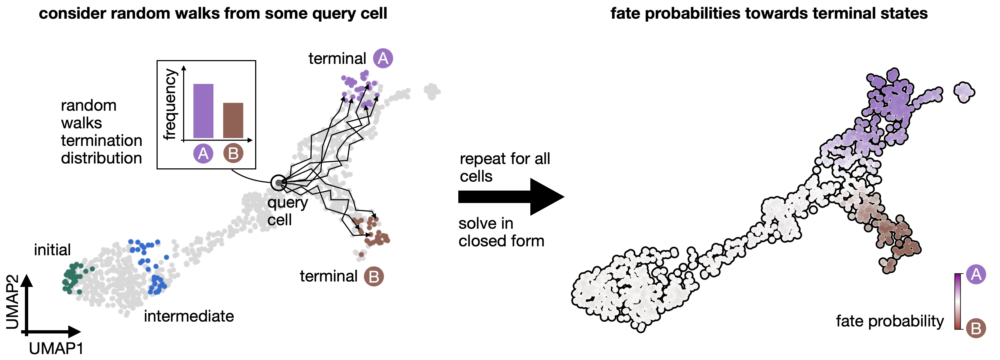
**`Quantifying cellular fate bias with absorption probabilities`**: For each cell that is not assigned to a terminal state, we estimate its fate probabilities of reaching any terminal state. To compute fate probabilities, we consider random walks, starting from the query cell, and count how often these end up in each terminal state. We repeat this many times and use the arrival frequencies in terminal states as fate probabilities. Luckily, we do not actually have to simulate random walks: we use absorption probabilities on the Markov chain, which quantify these arrival frequencies for an infinite number of random walks [Lange et al., 2022].

## Estimate cellular fate bias
### Compute fate probabilities
We compute fate_probabilities by aggregating over all random walks that start in a given cell and end in some terminal population. There exists an analytical solution to this problem called absorption probabilities, their computation is 30x faster in CellRank 2 compared to version 1 and scales to millions of cells.

conda install -c conda-forge petsc4py=3.19.0 slepc4py to solve the error:  'petsc4py.PETSc.KSP' object has no attribute 'converged'

In [ ]:
g2.compute_fate_probabilities()
g2.plot_fate_probabilities(same_plot=False)

Most cells appear to be fate-biased towards SS006. We can visualize these probabilities in compact form by coloring cells according to their most-likely fate, with color intensity reflecting the degree of lineage-bias by using plot_fate_probabilities().

In [ ]:
g2.plot_fate_probabilities(same_plot=True)

In [ ]:
cr.pl.circular_projection(adata, keys=['batch', 'batch'], legend_loc="right")

## Aggregate fate probabilities
Often, we are interested in aggregated fate probabilities over a group of cells, like a cell- type or state. As an example, let’s focus on the transition of initial to terminal state. Let’s start with an overview of these subpopulations.

In [ ]:
term_states = ["SS005", "SS006", "SS007", 'SS008']
sc.pl.embedding(
    adata, basis="umap", color="batch", groups=term_states, legend_loc="right"
)

In [ ]:
cr.pl.aggregate_fate_probabilities(
    adata,
    mode="heatmap",
    lineages=["SS007"],
    cluster_key="batch",
    clusters=term_states,
)

In [ ]:
cr.pl.aggregate_fate_probabilities(
    adata,
    mode="violin",
    lineages=["SS006"],
    cluster_key="batch",
    clusters=term_states,
)

In [ ]:
cr.pl.aggregate_fate_probabilities(
    adata,
    mode="violin",
    lineages=["SS008"],
    cluster_key="batch",
    clusters=term_states,
)

## Uncover driver genes
### Correlate fate probabilities with gene expression
We uncover putative driver genes by correlating fate probabilities with gene expression using the compute_lineage_drivers() method. In other words, if a gene is systematically higher or lower expressed in cells that are more or less likely to differentiate towards a given terminal states, respectively, then we call this gene a putative driver gene.

As an example, let’s focus on Delta cell generation again, and let’s restrict the correlation-computation to the relevant clusters.

In [ ]:
driver_clusters = ["SS005", "SS006", "SS007", 'SS008']

delta_df = g2.compute_lineage_drivers(
    lineages=["SS006"], cluster_key="batch", clusters=driver_clusters
)
delta_df.head(5)

In [ ]:
delta_df = g2.compute_lineage_drivers(
    lineages=["SS007"], cluster_key="batch", clusters=driver_clusters
)
delta_df.head(5)

In [ ]:
delta_df = g2.compute_lineage_drivers(
    lineages=["SS008"], cluster_key="batch", clusters=driver_clusters
)
delta_df.head(5)

In [ ]:
adata.obs["fate_probabilities_delta"] = g2.fate_probabilities["SS007"].X.flatten()

sc.pl.embedding(
    adata,
    basis="umap",
    color=["fate_probabilities_delta"] + list(delta_df.index[:8]),
    color_map="viridis",
    s=50,
    ncols=3,
    vmax="p96",
)

## Visualizing and Clustering Gene Expression Trends

In this tutorial, you will learn how to:

   + compute and visualize gene expression trends along specific differentiation trajectories.
   + cluster expression trends to detect genes with similar dynamical patterns.

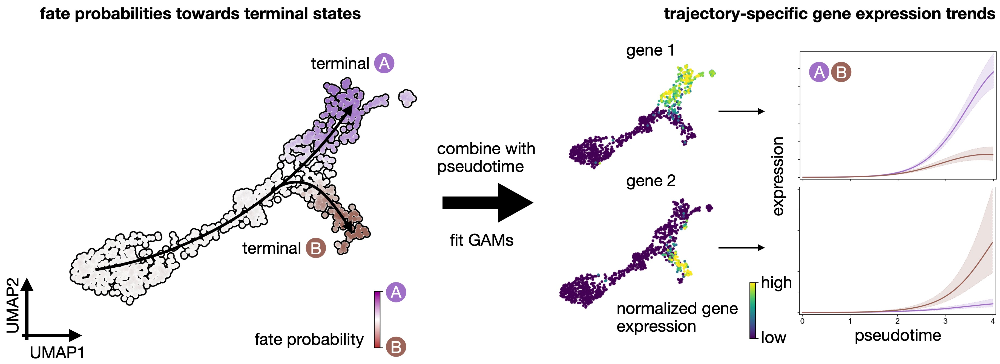
CellRank fits Generalized Additive Models to recover continuous gene expression dynamics along specific trajectories.

### Let's compute pseudotime

In [ ]:
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')

### Compute imputed gene expression data using MAGIC

Markov Affinity-based Graph Imputation of Cells (MAGIC) is an algorithm for denoising high-dimensional data most commonly applied to single-cell RNA sequencing data

+ MAGIC imputes missing data values on sparse data sets, restoring the structure of the data
+ It also proves dimensionality reduction and gene expression visualizations
+ MAGIC can be performed on a variety of datasets

In [2]:

#!pip install --user magic-impute
import magic
import scprep

In [ ]:
magic_op = magic.MAGIC()

In [ ]:
adata_magic = magic_op.fit_transform(adata, genes="all_genes")

In [ ]:
inputed = pd.DataFrame(adata_magic.X, columns=adata_magic.var_names, index=adata_magic.obs_names)
inputed

In [ ]:
# filter to those genes for which we have imputed expression values
mask = np.in1d(adata.var_names, inputed.columns)
adata = adata[:, mask].copy()

In [ ]:
# add imputed data to an extra layer in AnnData
adata.layers["magic_imputed_data"] = inputed[adata.var_names].loc[
    adata.obs_names
]

In [ ]:
sc.pl.embedding(
    adata,
    basis="umap",
    color=["batch", "velocity_pseudotime"],
    color_map="gnuplot",
    legend_loc="on data",
)

This looks promising, the pseudotime increases continiously from early states (SS005) until late states (SS006 to 8). We can make this more quantitative, without relying on the 2D UMAP, by showing the distribution of pseudotime values per cluster.

In [ ]:
sc.pl.violin(adata, keys=["velocity_pseudotime"], groupby="batch", rotation=90)

### Visualize expression trends via line plots

The first step in gene trend plotting is to initialite a ```model for GAM``` fitting.

In [ ]:
!pip install rpy2

In [ ]:
model = cr.models.GAMR(adata, n_knots=6, smoothing_penalty=10.0)

In [ ]:
cr.pl.gene_trends(
    adata,
    model=model,
    data_key="magic_imputed_data",
    genes=["HLA-A", "TAP1", "APOL2", "MX2", "CMPK2", "IFIT2", "IFIT1", "MX1", "IFI44", "TRIB3"],
    same_plot=True,
    ncols=2,
    time_key="velocity_pseudotime",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

### Visualize expression cascades via heatmaps

In this section, we focus on just one trajectory and visualize the temporal activation of several genes along this trajectory. As an example, let’s take the Beta trajectory. We computed putative driver genes for this trajectory in the Estimating Fate Probabilities and Driver Genes tutorial, here, we explore their temporal activation cascade. To do this, as before, we fit the expression of putative Beta-driver genes along the pseudotime using GAMs, weighting each cell’s contribution according to Beta fate_probabilities.

In [ ]:
# compute putative drivers for the Beta trajectory
beta_drivers = g2.compute_lineage_drivers(lineages=["SS006", "SS007", "SS008"])

# plot heatmap
cr.pl.heatmap(
    adata,
    model=model,  # use the model from before
    lineages=["SS006", "SS007", "SS008"],
    cluster_key="batch",
    show_fate_probabilities=True,
    data_key="magic_imputed_data",
    genes=beta_drivers.head(40).index,
    time_key="velocity_pseudotime",
    figsize=(12, 10),
    show_all_genes=True,
    weight_threshold=(1e-3, 1e-3),
)

Each row in these heatmap corresponds to one gene, sorted according to their expression peak in pseudotime. We show cluster annotations, and the fate probabilities used to determine each cells’s contribution to the each state trajectory, at the top.

### Cluster gene expression trends
#### Compute clustering

To identify genes with similar expression patterns, CellRank can cluster expression trends. Importantly, we do this again in a trajectory-specific fashion, i.e. we only consider GAM-fitted expression trends towards Beta cells and cluster these. We only consider highly-variable genes here to speed up the computation.



In [ ]:
!pip3 install leidenalg

In [ ]:
cr.pl.cluster_trends(
    adata,
    model=model,  # use the model from before
    lineage="SS006",
    data_key="magic_imputed_data",
    genes=adata[:, adata.var["highly_variable"]].var_names,
    time_key="velocity_pseudotime",
    weight_threshold=(1e-3, 1e-3),
    n_jobs=8,
    random_state=0,
    clustering_kwargs={"resolution": 0.2, "random_state": 0},
    neighbors_kwargs={"random_state": 0},
)

In [ ]:
gdata = adata.uns["lineage_SS006_trend"].copy()
gdata

In [ ]:
cols = ["means", "dispersions"]
gdata.obs = gdata.obs.merge(
    right=adata.var[cols], how="left", left_index=True, right_index=True
)
gdata

### Analzye gene clusters
We have a gene-level PCA and k-NN graph - let’s use that to compute and plot a gene-level UMAP embedding.

In [ ]:
sc.tl.umap(gdata, random_state=0)

sc.pl.embedding(gdata, basis="umap", color=["clusters", "means"], vmax="p95")


Each dot represent a gene, colored by expression trend clusters along the Beta trajectory (left) or the mean expression across cells (right). Let’s highlight a few driver genes we discussed above.

In [ ]:
genes = ["HLA-A", "MGAT1", "LGALS3BP", "TMBIM6", "SERTAD1", "EDN1", "MX1", "IFI44", "PANX1"]

# make sure the genes were included in the cluster analysis
mask = np.array([gene in gdata.obs_names for gene in genes])

if not mask.all():
    print(f"Could not find {np.array(genes)[~mask]}")

# subset to the genes that are present
genes = list(np.array(genes)[mask])

# retrieve their indices for plotting
indices = [np.where(np.in1d(gdata.obs_names, gene))[0][0] for gene in genes]
title = ["clusters"] + genes

scv.pl.scatter(
    gdata, c=["clusters"] + indices, title=title, ncols=3, legend_loc="right"
)

In [ ]:
gdata[genes].obs

In [ ]:
# obtain some genes from the same cluster, sort by mean expression
mid_peak_genes = (
    gdata[gdata.obs["clusters"] == "1"]
    .obs.sort_values("means", ascending=False)
    .head(8)
    .index
)

# plot
cr.pl.gene_trends(
    adata,
    model=model,
    lineages="SS006",
    cell_color="batch",
    data_key="magic_imputed_data",
    genes=["HLA-A"] + list(mid_peak_genes),
    same_plot=True,
    ncols=3,
    time_key="velocity_pseudotime",
    hide_cells=False,
    weight_threshold=(1e-3, 1e-3),
)

To showcase the flexibility of this plotting function, we’re only drawing the trends towards SS008, and we visualize cells, colored by their cluster assignment. This serves as an example of how gene trend clustering can be used to identify genes that show similar expression dynamics to a known driver gene of a given lineage.

In [4]:
session_info.show()

In [3]:
cr.logging.print_versions()

cellrank==2.0.3.dev1+gcabbd34 scanpy==1.9.6 anndata==0.10.4 numpy==1.23.2 numba==0.58.1 scipy==1.12.0 pandas==1.4.1 pygpcca==1.0.4 scikit-learn==1.4.0 statsmodels==0.14.1 python-igraph==0.11.3 scvelo==0.2.5 pygam==0.8.0 matplotlib==3.7.3 seaborn==0.13.1
